In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from __future__ import print_function
import keras
from keras.preprocessing.image import ImageDataGenerator, load_img

/home/vitaliy/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


# Experiment 2. Train last 4 layers

In [3]:
image_size = 256
train_folder = "Images/train/"
test_folder = "Images/test/"

Create model

In [4]:
from keras.applications import VGG16

#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


from keras import models
from keras import layers
from keras import optimizers

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(21, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.topology.InputLayer object at 0x7fc0c881c9e8> False
<keras.layers.convolutional.Conv2D object at 0x7fc30a927c18> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c881cb38> False
<keras.layers.pooling.MaxPooling2D object at 0x7fc0c8552d30> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c85883c8> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c8588da0> False
<keras.layers.pooling.MaxPooling2D object at 0x7fc0c852c668> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c8540cc0> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c84d6eb8> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c84eb5f8> False
<keras.layers.pooling.MaxPooling2D object at 0x7fc0c84917f0> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c84bab70> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c84baba8> False
<keras.layers.convolutional.Conv2D object at 0x7fc0c8463dd8> False
<keras.layers.pooling.MaxPooling2D object at 0x7fc0c840e7b8> Fa

Found 7353 images belonging to 21 classes.
Found 1600 images belonging to 21 classes.
Epoch 1/20
115/114 [==============================] - 80s 699ms/step - loss: 0.8298 - acc: 0.7491 - val_loss: 0.4586 - val_acc: 0.8588
Epoch 2/20
115/114 [==============================] - 76s 663ms/step - loss: 0.1967 - acc: 0.9344 - val_loss: 0.4077 - val_acc: 0.8900
Epoch 3/20
115/114 [==============================] - 79s 691ms/step - loss: 0.1036 - acc: 0.9679 - val_loss: 0.6849 - val_acc: 0.8538
Epoch 4/20
115/114 [==============================] - 79s 685ms/step - loss: 0.0664 - acc: 0.9802 - val_loss: 0.6272 - val_acc: 0.8763
Epoch 5/20
115/114 [==============================] - 79s 685ms/step - loss: 0.0506 - acc: 0.9865 - val_loss: 0.5278 - val_acc: 0.9081
Epoch 6/20
115/114 [==============================] - 82s 710ms/step - loss: 0.0555 - acc: 0.9909 - val_loss: 0.6202 - val_acc: 0.8919
Epoch 7/20
115/114 [==============================] - 80s 692ms/step - loss: 0.0430 - acc: 0.9912 - val_

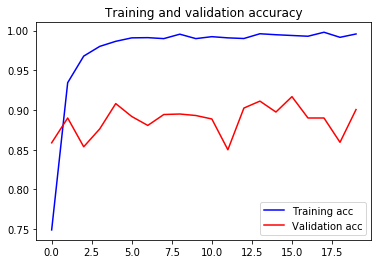

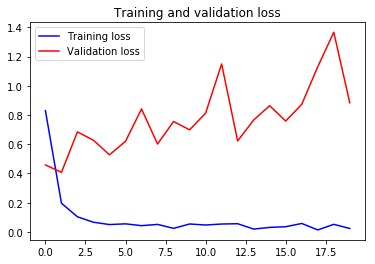

In [7]:

# No Data augmentation 
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 64
val_batchsize = 10

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_folder,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        test_folder,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the Model
model.save('last4_layers.h5')

# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Found 1600 images belonging to 21 classes.
160/160 [==============================] - 13s 79ms/step
No of errors = 159/1600


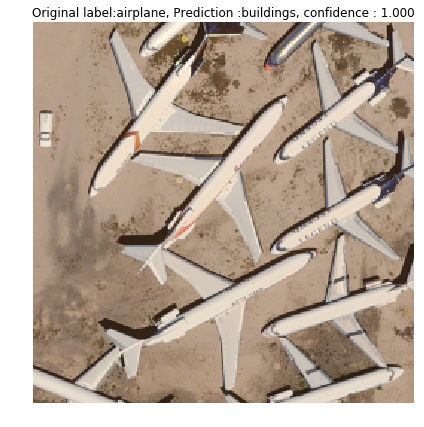

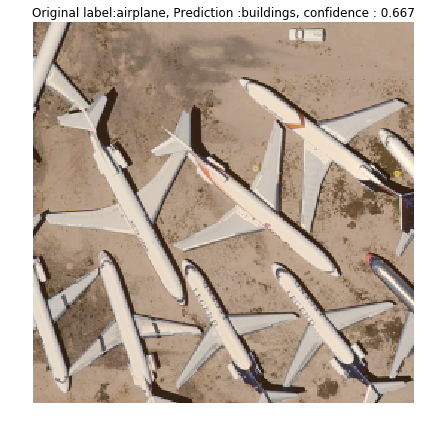

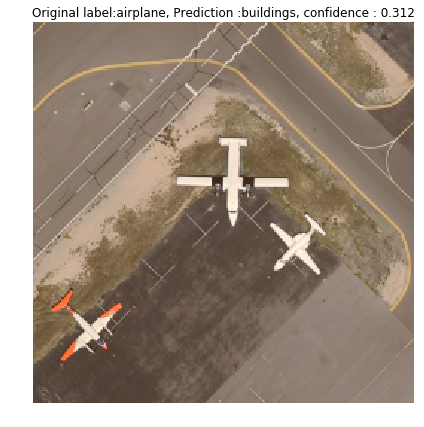

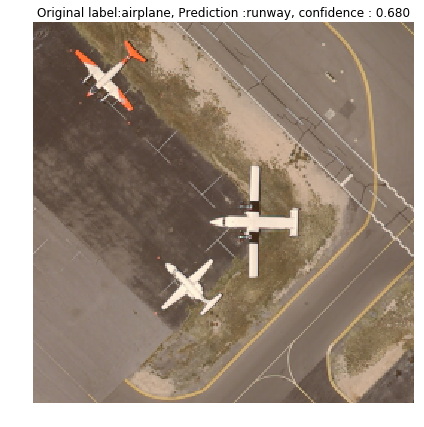

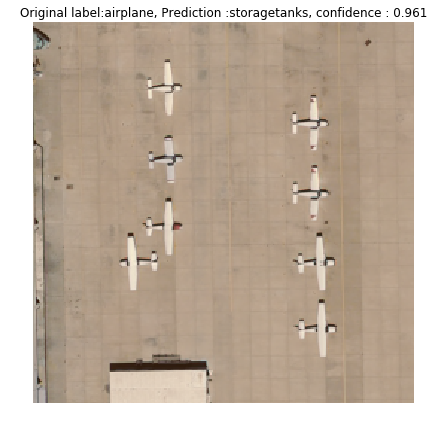

...

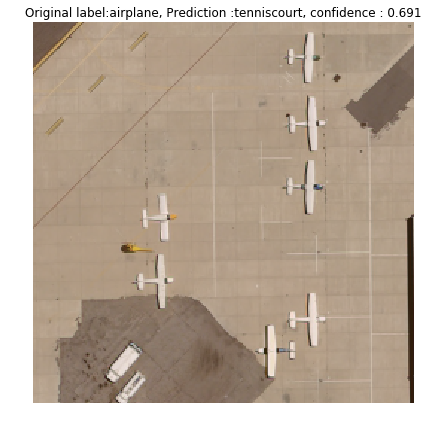

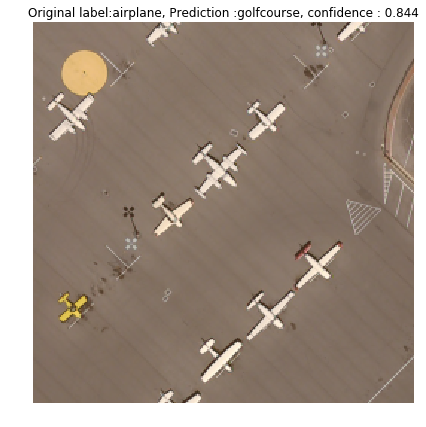

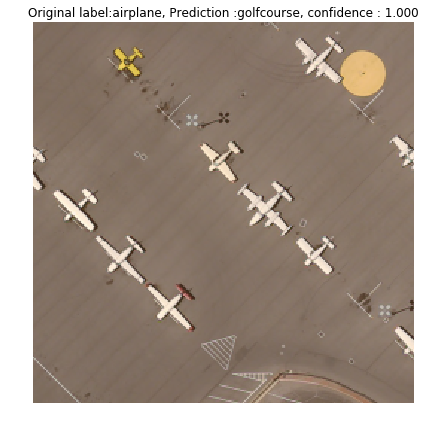

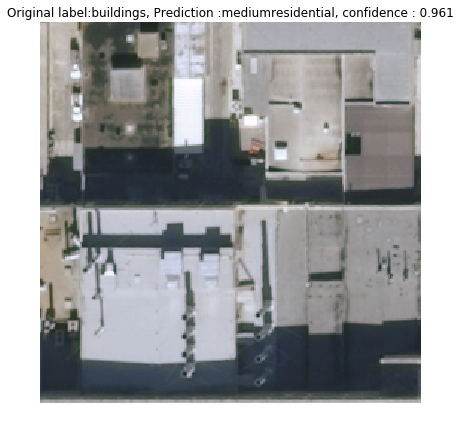

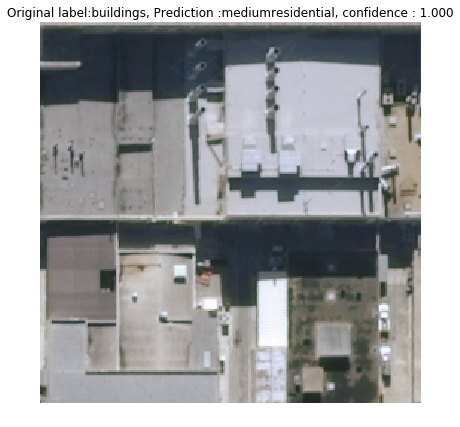

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


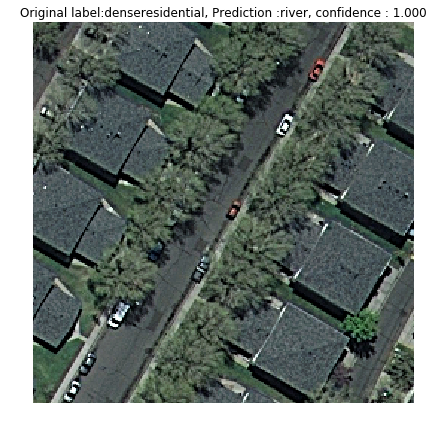

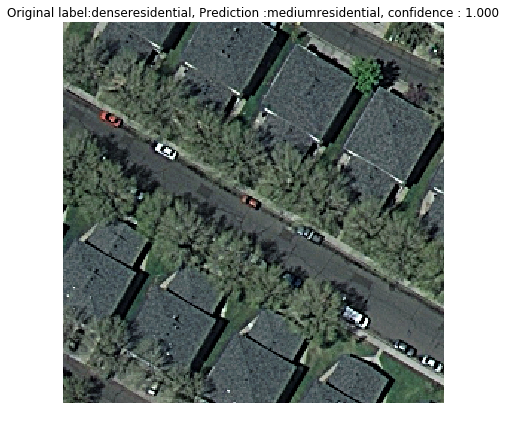

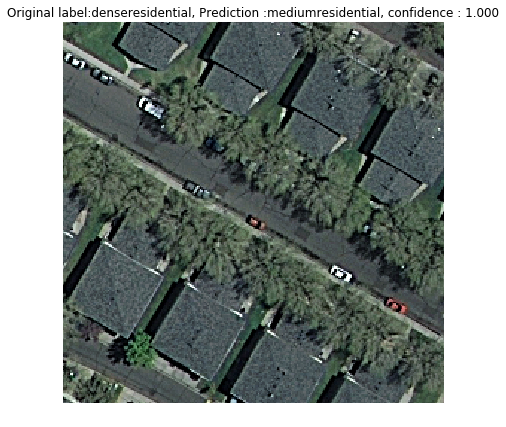

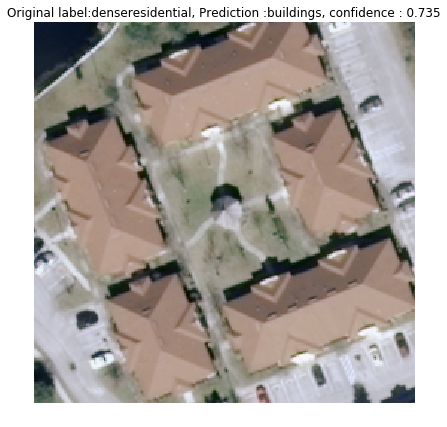

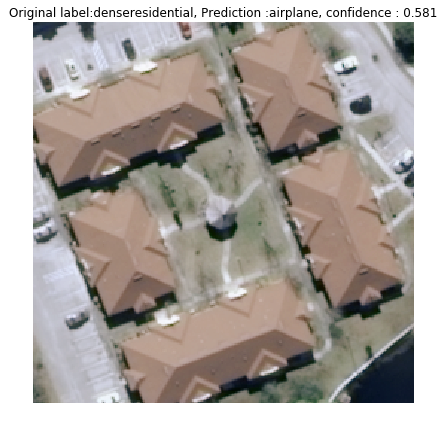

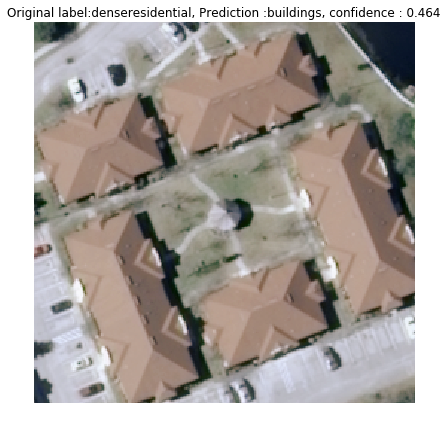

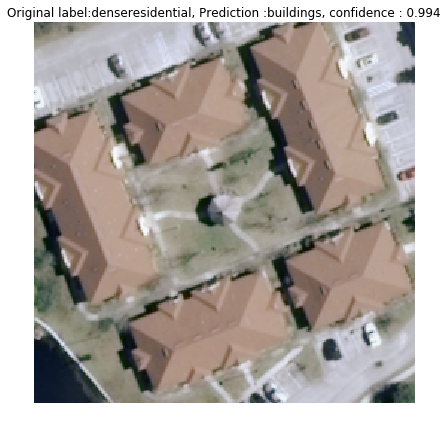

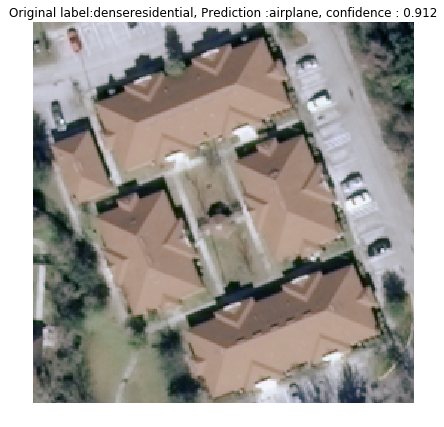

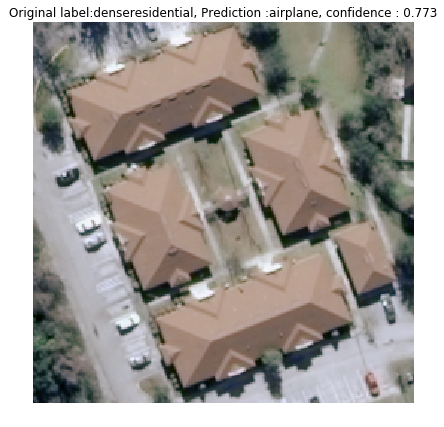

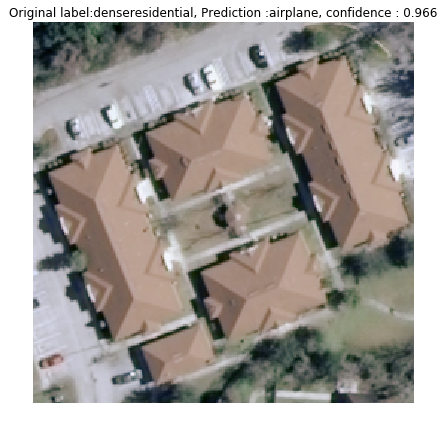

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


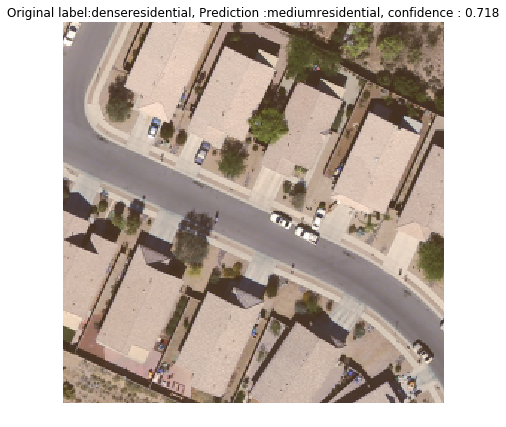

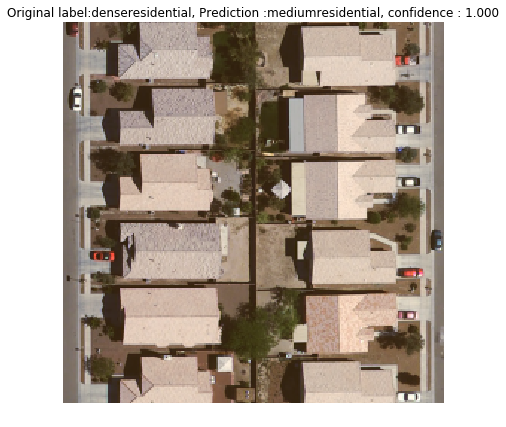

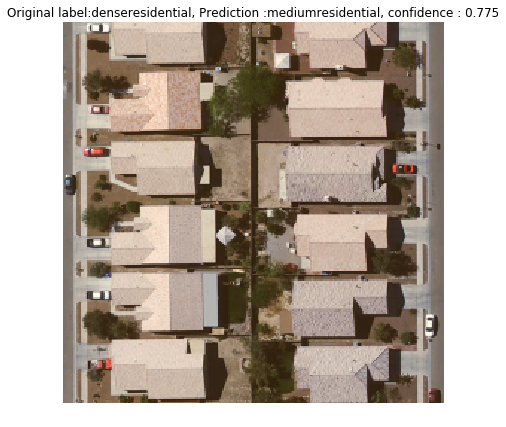

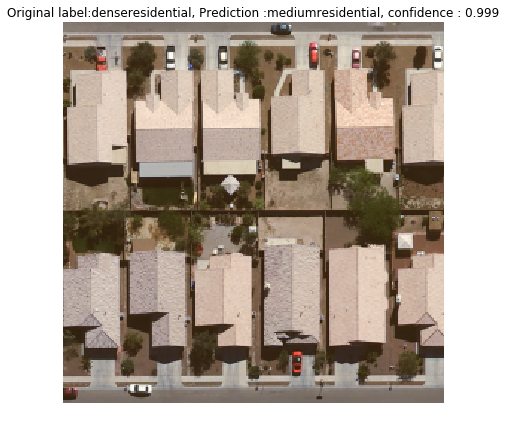

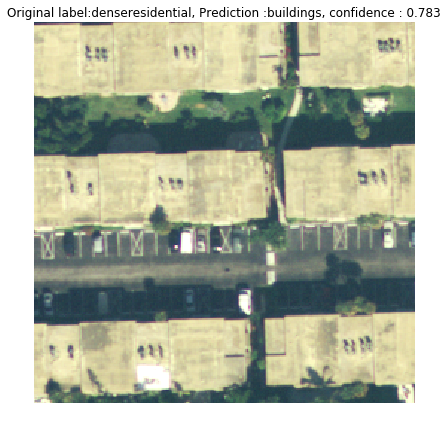

...

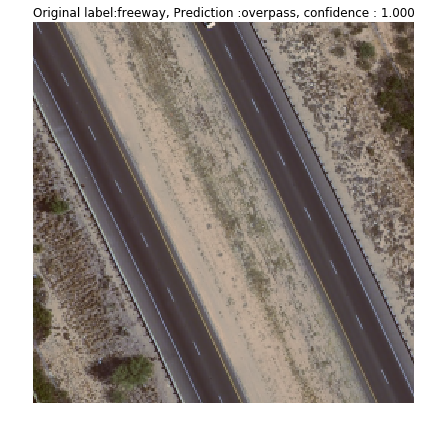

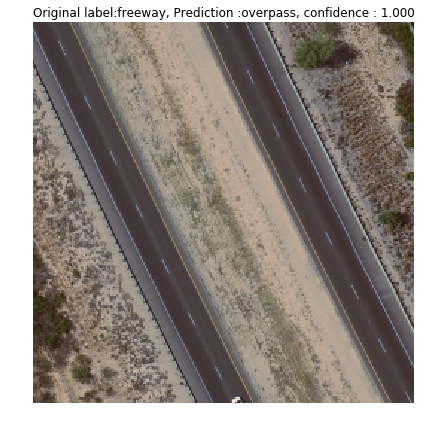

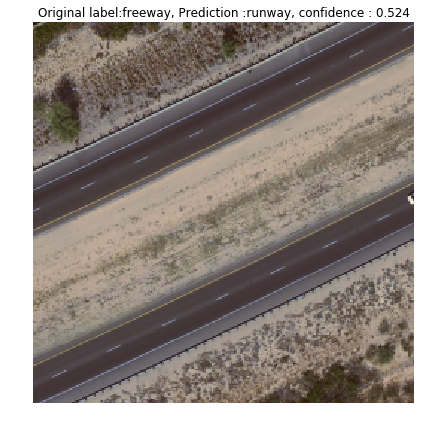

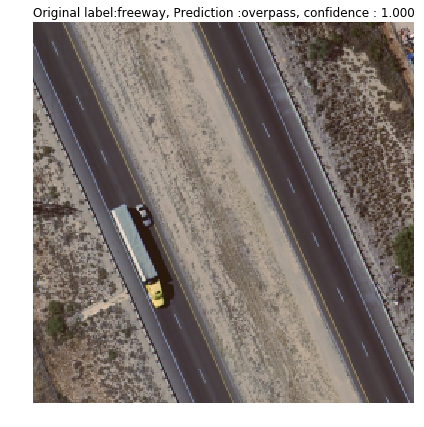

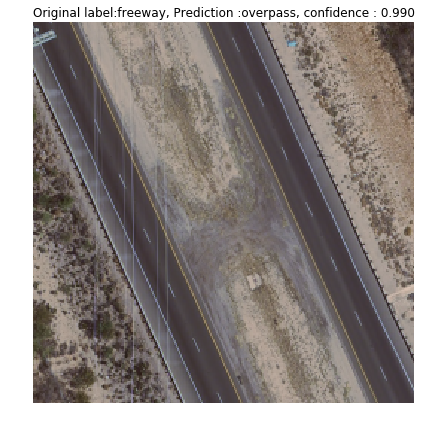

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


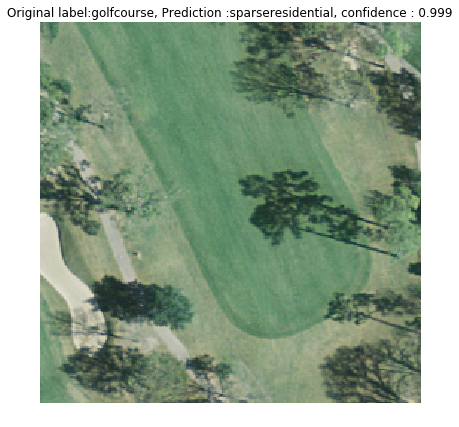

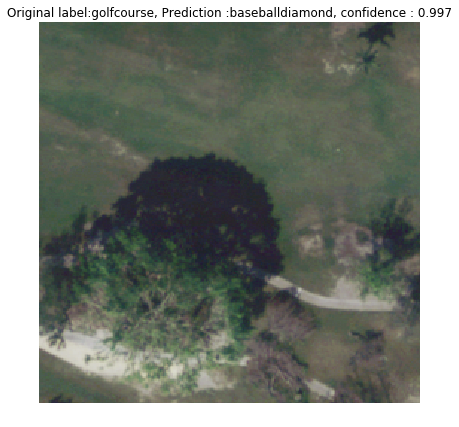

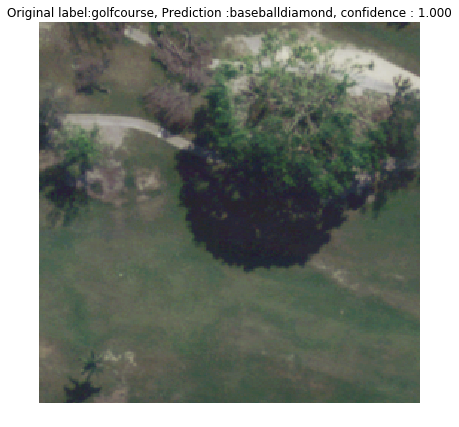

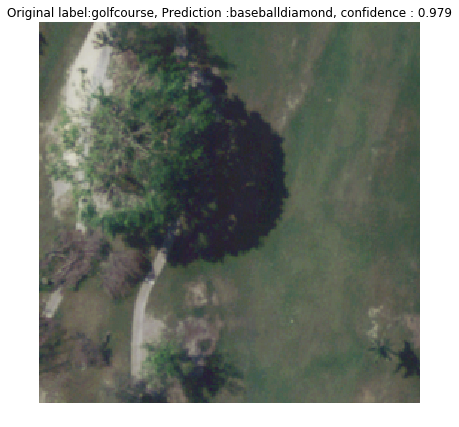

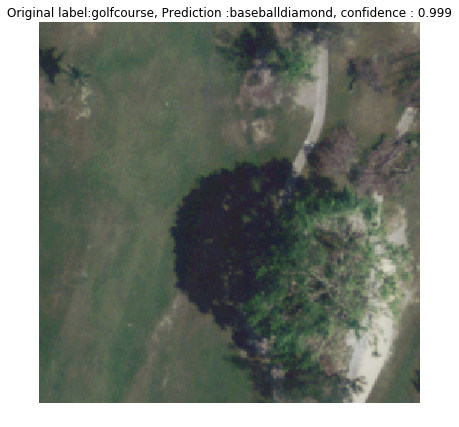

...

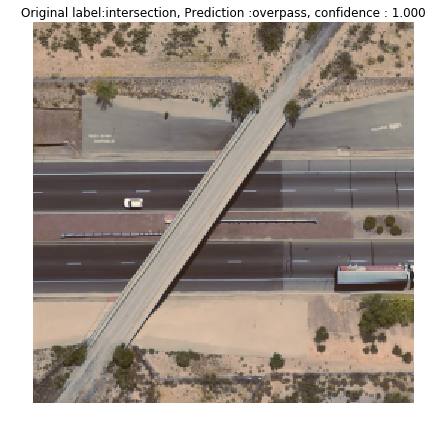

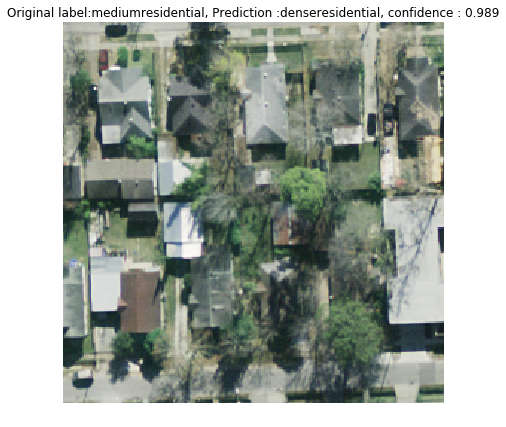

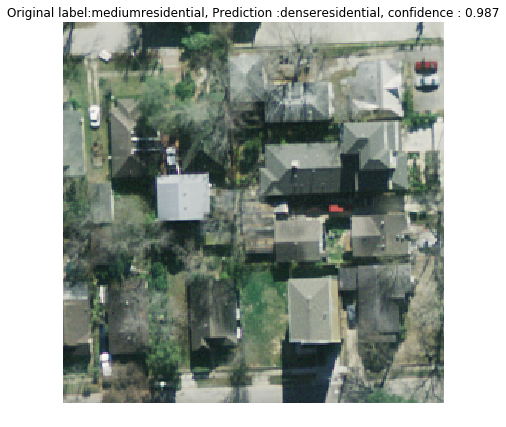

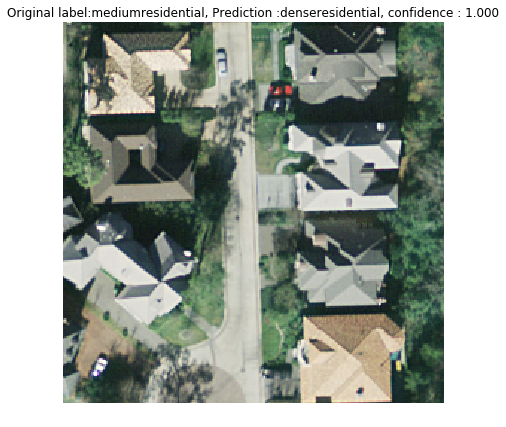

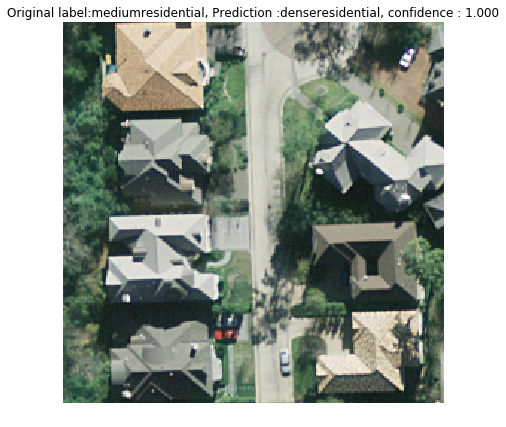

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


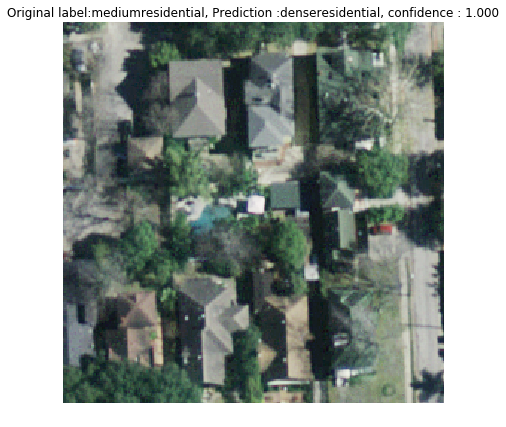

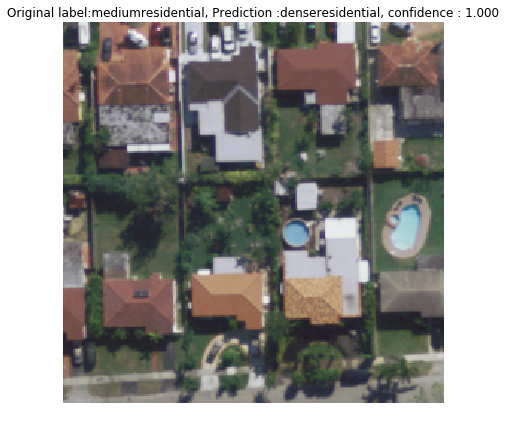

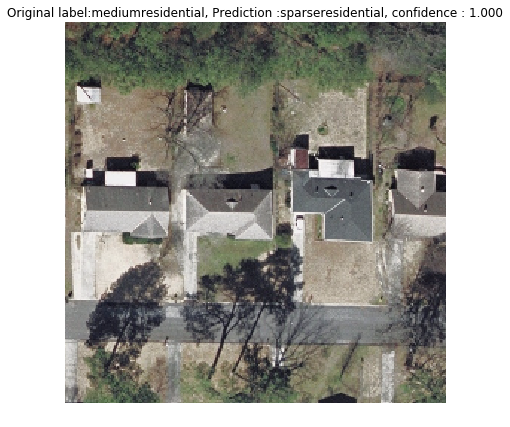

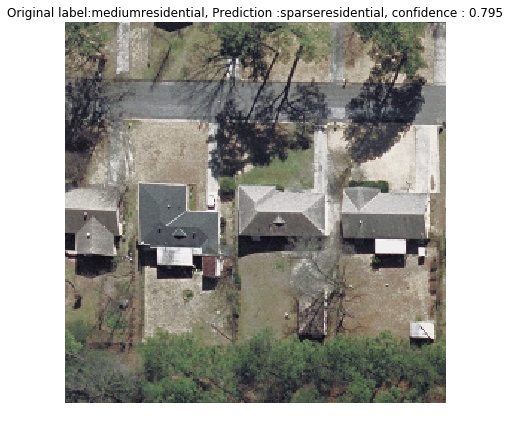

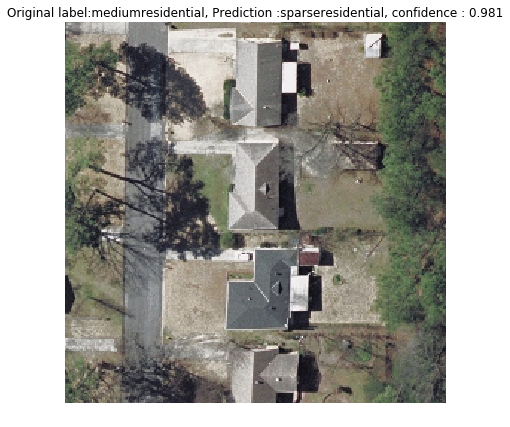

...

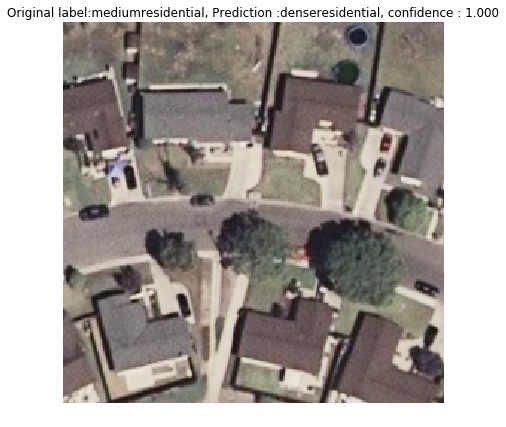

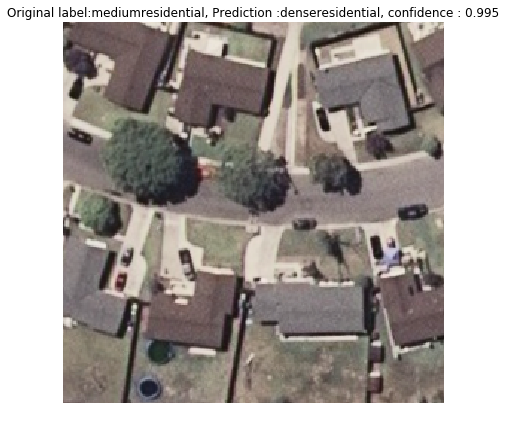

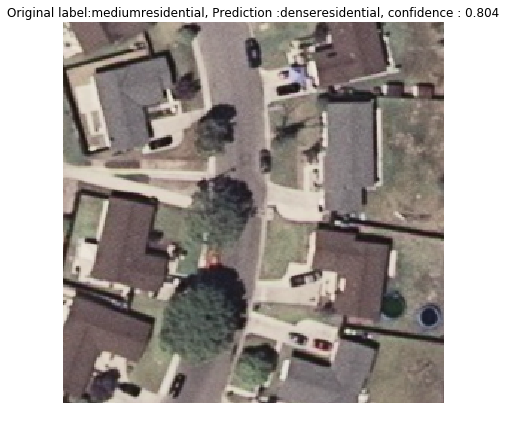

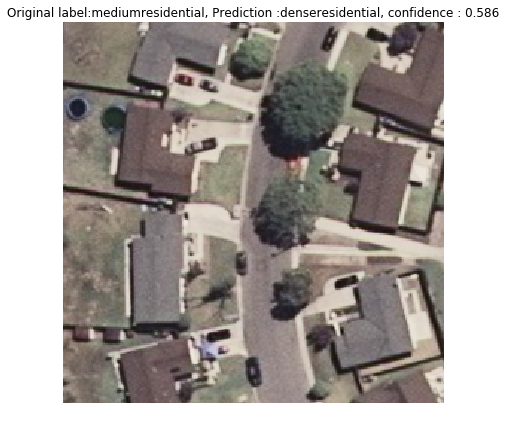

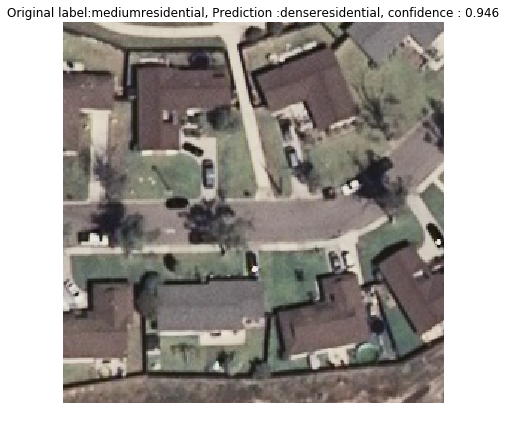

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


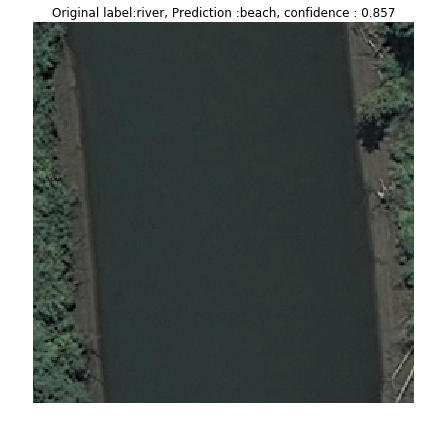

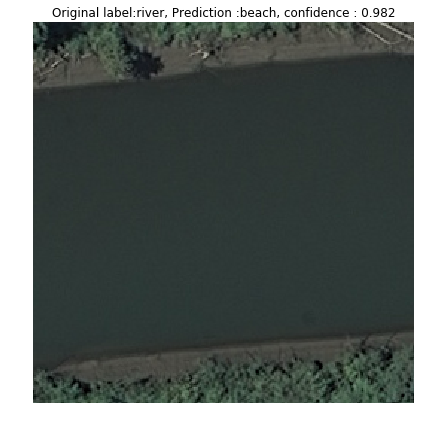

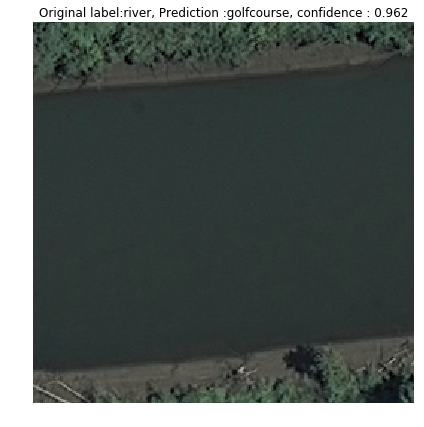

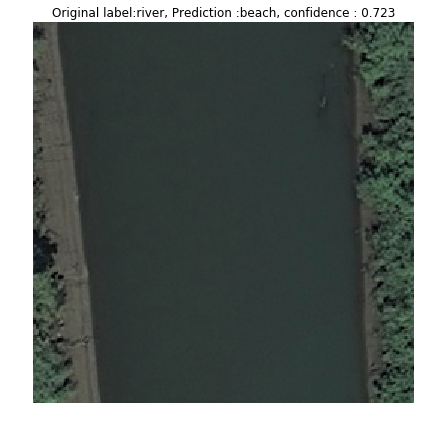

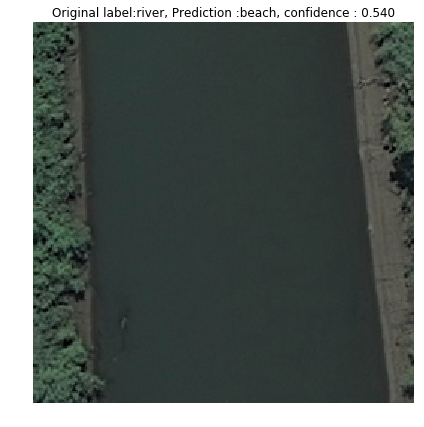

...

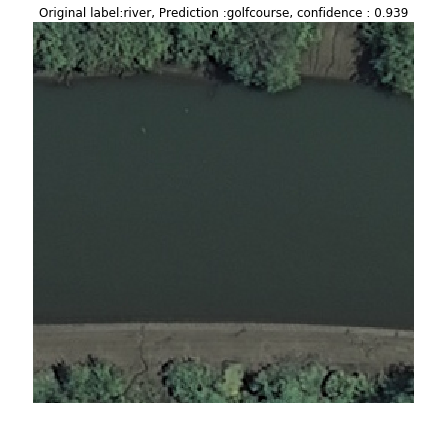

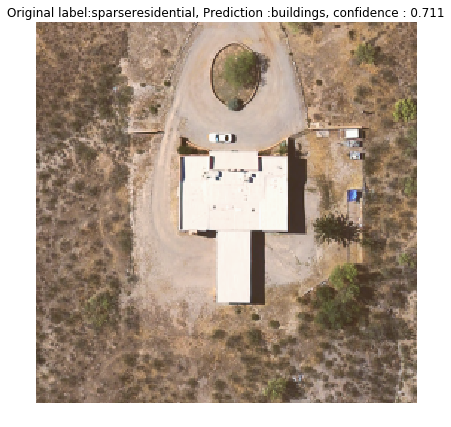

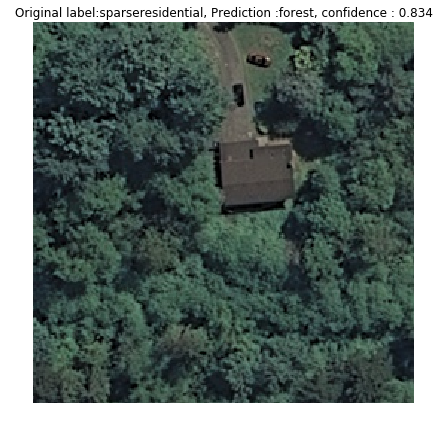

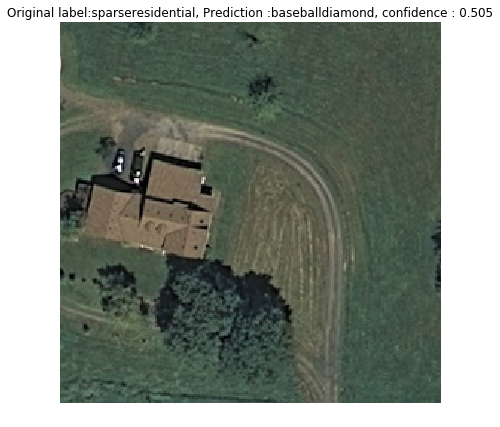

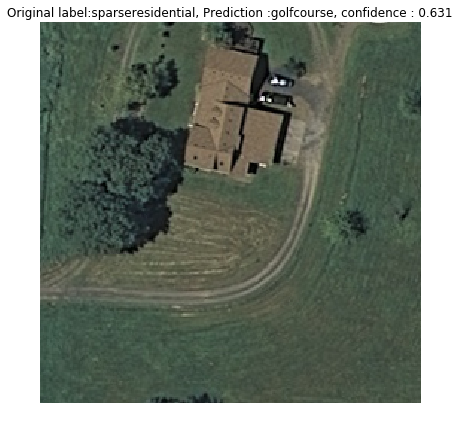

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [9]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        test_folder,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(test_folder,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()